In [2]:
import datetime
import time

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import sklearn.model_selection

In [3]:
turkey_earthquakes_1915_2021 = pd.read_csv(
    "M:/DATA_ANALYTICS/Projects/Turkey Earthquakes (1915-2025)/Data/turkey_earthquakes_1915-02-14_2021-01-01.csv",
    sep=";",
)

turkey_earthquakes_1994_2023 = pd.read_csv(
    "M:/DATA_ANALYTICS/Projects/Turkey Earthquakes (1915-2025)/Data/turkey_earthquakes_1994-09-11 _ 2023-07-31.csv"
)

turkey_earthquakes_2023_2025_raw_ = pd.read_csv(
    "M:/DATA_ANALYTICS/Projects/Turkey Earthquakes (1915-2025)/Data/turkey_earthquakes_2023-08-01 _ 2025-02-28_raw_.csv"
)

In [4]:
turkey_earthquakes_1915_2021.head()

,No,Deprem Kodu,Olus tarihi,Olus zamani,Enlem,Boylam,Derinlik,xM,MD,ML,Mw,Ms,Mb,Tip,Yer
0,1,2.021010e+13,2021.01.01,16:36:21.41,35.9273,27.8658,26.1,3.9,0.0,3.9,3.7,0.0,0.0,Ke,RODOS ADASI (AKDENIZ)
1,2,2.020120e+13,2020.12.31,00:51:27.94,37.8435,26.7775,8.0,3.8,0.0,3.8,3.7,0.0,0.0,Ke,EGE DENIZI
2,3,2.020120e+13,2020.12.30,18:45:12.79,36.4918,28.7092,5.0,3.9,0.0,3.7,3.9,0.0,0.0,Ke,AKDENIZ
3,4,2.020120e+13,2020.12.30,13:40:12.22,37.7960,26.4165,14.4,4.4,0.0,4.4,4.3,0.0,0.0,Ke,ONIKI ADALAR (AKDENIZ)
4,5,2.020120e+13,2020.12.27,20:08:36.88,38.4172,39.1482,5.0,3.9,0.0,3.7,3.9,0.0,0.0,Ke,KAVAKKOY-SIVRICE (ELAZIG) [South West 0.5 km]


In [5]:
# Drop de columnas que no harán falta:

turkey_earthquakes_1915_2021.drop(
    [
        "MD",
        "ML",
        "Mw",
        "Ms",
        "Mb",
        "Tip",
    ],
    axis=1,
    inplace=True,
)

In [6]:
# Corregir la columna Deprem Kodu para igualar formato con los otros df:
turkey_earthquakes_1915_2021["Deprem Kodu"] = (
    turkey_earthquakes_1915_2021["Olus tarihi"].astype(str)
    + turkey_earthquakes_1915_2021["Olus zamani"].astype(str)
).str.replace(r"[\.:]", "", regex=True)

# Mostrar para revisar
turkey_earthquakes_1915_2021[["Deprem Kodu", "Olus tarihi", "Olus zamani"]].head()

,Deprem Kodu,Olus tarihi,Olus zamani
0,2021010116362141,2021.01.01,16:36:21.41
1,2020123100512794,2020.12.31,00:51:27.94
2,2020123018451279,2020.12.30,18:45:12.79
3,2020123013401222,2020.12.30,13:40:12.22
4,2020122720083688,2020.12.27,20:08:36.88


In [7]:
turkey_earthquakes_1994_2023.head()

,No,Deprem Kodu,Olus tarihi,Olus zamani,Enlem,Boylam,Der(km),xM,MD,ML,Mw,Ms,Mb,Tip,Yer
0,1,20230731215338,2023.07.31,21:53:38.29,37.4153,37.1703,4.0,3.5,0.0,3.5,3.4,0.0,0.0,Ke,DOGANLI-PAZARCIK (KAHRAMANMARAS) [East 1.3 km]
1,2,20230731152316,2023.07.31,15:23:16.85,38.1413,38.4340,5.2,3.5,0.0,3.5,3.4,0.0,0.0,Ke,AKSU-SINCIK (ADIYAMAN) [West 6.4 km]
2,3,20230731025049,2023.07.31,02:50:49.84,37.8352,26.8353,6.2,3.0,0.0,3.0,0.0,0.0,0.0,Ke,SISAM ADASI (EGE DENIZI)
3,4,20230730201940,2023.07.30,20:19:40.49,40.8085,31.0183,5.3,3.1,0.0,3.1,3.1,0.0,0.0,Ke,ICMELER-GOLYAKA (DUZCE) [South East 0.7 km]
4,5,20230730161352,2023.07.30,16:13:52.62,38.1290,38.1863,2.4,3.0,0.0,3.0,0.0,0.0,0.0,Ke,CAMPINAR-CELIKHAN (ADIYAMAN) [North West 4.3 km]


In [8]:
turkey_earthquakes_1994_2023 = turkey_earthquakes_1994_2023.rename(
    columns={"Der(km)": "Derinlik"}
)

In [9]:
# Generar nuevo Deprem Kodu con las centésimas incluidas
turkey_earthquakes_1994_2023["Deprem Kodu"] = (
    turkey_earthquakes_1994_2023["Olus tarihi"].astype(str)
    + turkey_earthquakes_1994_2023["Olus zamani"].astype(str)
).str.replace(r"[\.:]", "", regex=True)

In [10]:
turkey_earthquakes_1994_2023.head()

,No,Deprem Kodu,Olus tarihi,Olus zamani,Enlem,Boylam,Derinlik,xM,MD,ML,Mw,Ms,Mb,Tip,Yer
0,1,2023073121533829,2023.07.31,21:53:38.29,37.4153,37.1703,4.0,3.5,0.0,3.5,3.4,0.0,0.0,Ke,DOGANLI-PAZARCIK (KAHRAMANMARAS) [East 1.3 km]
1,2,2023073115231685,2023.07.31,15:23:16.85,38.1413,38.4340,5.2,3.5,0.0,3.5,3.4,0.0,0.0,Ke,AKSU-SINCIK (ADIYAMAN) [West 6.4 km]
2,3,2023073102504984,2023.07.31,02:50:49.84,37.8352,26.8353,6.2,3.0,0.0,3.0,0.0,0.0,0.0,Ke,SISAM ADASI (EGE DENIZI)
3,4,2023073020194049,2023.07.30,20:19:40.49,40.8085,31.0183,5.3,3.1,0.0,3.1,3.1,0.0,0.0,Ke,ICMELER-GOLYAKA (DUZCE) [South East 0.7 km]
4,5,2023073016135262,2023.07.30,16:13:52.62,38.1290,38.1863,2.4,3.0,0.0,3.0,0.0,0.0,0.0,Ke,CAMPINAR-CELIKHAN (ADIYAMAN) [North West 4.3 km]


In [11]:
# Drop de columnas que no harán falta:

turkey_earthquakes_1994_2023.drop(
    [
        "MD",
        "ML",
        "Mw",
        "Ms",
        "Mb",
        "Tip",
    ],
    axis=1,
    inplace=True,
)

In [12]:
turkey_earthquakes_2023_2025_raw_.head(3)

,_id,earthquake_id,provider,title,date,mag,depth,geojson,location_properties,rev,date_time,created_at,location_tz
0,64d596ad1b641ff72359d3cc,oqY6xyt1toKa1,kandilli,KAZANLI-KARLIOVA (BINGOL),2023.08.11 04:55:28,4.1,6.5,"{'type': 'Point', 'coordinates': [40.8815, 39....","{'closestCity': {'name': 'Erzurum', 'cityCode'...",NaN,2023-08-11 04:55:28,1691722528,Europe/Istanbul
1,64d5cf9d9f26a8e0970a91e3,o6gjcIOfDOxWu,kandilli,GUPLUCE-ELBISTAN (KAHRAMANMARAS),2023.08.11 08:57:23,3.3,5.0,"{'type': 'Point', 'coordinates': [37.1777, 38....","{'closestCity': {'name': 'Malatya', 'cityCode'...",NaN,2023-08-11 08:57:23,1691737043,Europe/Istanbul
2,64d620421b641ff72359d3d5,_4hXfu3P4aBKA,kandilli,EVCIHUYUK-ELBISTAN (KAHRAMANMARAS),2023.08.11 14:42:50,3.9,5.0,"{'type': 'Point', 'coordinates': [37.2037, 38....","{'closestCity': {'name': 'Malatya', 'cityCode'...",NaN,2023-08-11 14:42:50,1691757770,Europe/Istanbul


In [13]:
# Revisar primeras y últimas fechas
print("Primera fecha:", turkey_earthquakes_2023_2025_raw_["date_time"].min())
print("Última fecha:", turkey_earthquakes_2023_2025_raw_["date_time"].max())

Primera fecha: 2023-08-11 04:55:28
Última fecha: 2025-02-21 17:37:14


In [14]:
# Crear la columna "No" numerando del 1 en adelante
turkey_earthquakes_2023_2025_raw_["No"] = range(
    1, len(turkey_earthquakes_2023_2025_raw_) + 1
)

In [15]:
# Renombrar la columna "mag" a "xM"
turkey_earthquakes_2023_2025_raw_.rename(columns={"mag": "xM"}, inplace=True)

In [16]:
# Renombrar la columna "depth" a "Derinlik"
turkey_earthquakes_2023_2025_raw_.rename(columns={"depth": "Derinlik"}, inplace=True)

In [17]:
# Renombrar la columna "title" a "Yer"
turkey_earthquakes_2023_2025_raw_.rename(columns={"title": "Yer"}, inplace=True)

In [18]:
# Dividir la columna 'date' en fecha y hora
turkey_earthquakes_2023_2025_raw_["Olus tarihi"] = (
    turkey_earthquakes_2023_2025_raw_["date"].str.split(" ").str[0]
)
turkey_earthquakes_2023_2025_raw_["Olus zamani"] = (
    turkey_earthquakes_2023_2025_raw_["date"].str.split(" ").str[1]
)

# Añadir ".00" al final de la hora para que tenga el formato correcto (añadiendo centésimas de segundo)
turkey_earthquakes_2023_2025_raw_["Olus zamani"] = (
    turkey_earthquakes_2023_2025_raw_["Olus zamani"] + ".00"
)

# Mostrar para revisar
turkey_earthquakes_2023_2025_raw_[["date", "Olus tarihi", "Olus zamani"]].head()

,date,Olus tarihi,Olus zamani
0,2023.08.11 04:55:28,2023.08.11,04:55:28.00
1,2023.08.11 08:57:23,2023.08.11,08:57:23.00
2,2023.08.11 14:42:50,2023.08.11,14:42:50.00
3,2023.08.11 15:22:24,2023.08.11,15:22:24.00
4,2023.08.11 16:20:58,2023.08.11,16:20:58.00


In [19]:
# Generar nuevo Deprem Kodu con las centésimas incluidas
turkey_earthquakes_2023_2025_raw_["Deprem Kodu"] = (
    turkey_earthquakes_2023_2025_raw_["Olus tarihi"].astype(str)
    + turkey_earthquakes_2023_2025_raw_["Olus zamani"].astype(str)
).str.replace(r"[\.:]", "", regex=True)

In [20]:
print(turkey_earthquakes_2023_2025_raw_["geojson"].iloc[0])

{'type': 'Point', 'coordinates': [40.8815, 39.356]}


In [21]:
import ast

# Convertir string a diccionario y extraer Boylam y Enlem
turkey_earthquakes_2023_2025_raw_["Boylam"] = turkey_earthquakes_2023_2025_raw_[
    "geojson"
].apply(lambda x: ast.literal_eval(x)["coordinates"][0])
turkey_earthquakes_2023_2025_raw_["Enlem"] = turkey_earthquakes_2023_2025_raw_[
    "geojson"
].apply(lambda x: ast.literal_eval(x)["coordinates"][1])

# Vista previa
turkey_earthquakes_2023_2025_raw_[["geojson", "Enlem", "Boylam"]].head()

,geojson,Enlem,Boylam
0,"{'type': 'Point', 'coordinates': [40.8815, 39....",39.3560,40.8815
1,"{'type': 'Point', 'coordinates': [37.1777, 38....",38.1002,37.1777
2,"{'type': 'Point', 'coordinates': [37.2037, 38....",38.3245,37.2037
3,"{'type': 'Point', 'coordinates': [38.2067, 38....",38.3328,38.2067
4,"{'type': 'Point', 'coordinates': [23.6305, 39....",39.6890,23.6305


In [22]:
turkey_earthquakes_2023_2025_raw_.columns

Index(['_id', 'earthquake_id', 'provider', 'Yer', 'date', 'xM', 'Derinlik',
       'geojson', 'location_properties', 'rev', 'date_time', 'created_at',
       'location_tz', 'No', 'Olus tarihi', 'Olus zamani', 'Deprem Kodu',
       'Boylam', 'Enlem'],
      dtype='object')

In [23]:
# Drop de columnas que no harán falta:

turkey_earthquakes_2023_2025_raw_.drop(
    [
        "_id",
        "earthquake_id",
        "provider",
        "date",
        "geojson",
        "location_properties",
        "rev",
        "date_time",
        "created_at",
        "location_tz",
    ],
    axis=1,
    inplace=True,
)

In [24]:
turkey_earthquakes_1915_2021.head(2)

,No,Deprem Kodu,Olus tarihi,Olus zamani,Enlem,Boylam,Derinlik,xM,Yer
0,1,2021010116362141,2021.01.01,16:36:21.41,35.9273,27.8658,26.1,3.9,RODOS ADASI (AKDENIZ)
1,2,2020123100512794,2020.12.31,00:51:27.94,37.8435,26.7775,8.0,3.8,EGE DENIZI


In [25]:
turkey_earthquakes_1994_2023.head(2)

,No,Deprem Kodu,Olus tarihi,Olus zamani,Enlem,Boylam,Derinlik,xM,Yer
0,1,2023073121533829,2023.07.31,21:53:38.29,37.4153,37.1703,4.0,3.5,DOGANLI-PAZARCIK (KAHRAMANMARAS) [East 1.3 km]
1,2,2023073115231685,2023.07.31,15:23:16.85,38.1413,38.4340,5.2,3.5,AKSU-SINCIK (ADIYAMAN) [West 6.4 km]


In [26]:
turkey_earthquakes_2023_2025_raw_.head(2)

,Yer,xM,Derinlik,No,Olus tarihi,Olus zamani,Deprem Kodu,Boylam,Enlem
0,KAZANLI-KARLIOVA (BINGOL),4.1,6.5,1,2023.08.11,04:55:28.00,2023081104552800,40.8815,39.3560
1,GUPLUCE-ELBISTAN (KAHRAMANMARAS),3.3,5.0,2,2023.08.11,08:57:23.00,2023081108572300,37.1777,38.1002


In [27]:
turkey_earthquakes_2023_2025_raw_.head(2)

,Yer,xM,Derinlik,No,Olus tarihi,Olus zamani,Deprem Kodu,Boylam,Enlem
0,KAZANLI-KARLIOVA (BINGOL),4.1,6.5,1,2023.08.11,04:55:28.00,2023081104552800,40.8815,39.3560
1,GUPLUCE-ELBISTAN (KAHRAMANMARAS),3.3,5.0,2,2023.08.11,08:57:23.00,2023081108572300,37.1777,38.1002


In [28]:
print(turkey_earthquakes_1915_2021.shape)
print(turkey_earthquakes_1994_2023.shape)
print(turkey_earthquakes_2023_2025_raw_.shape)

(17370, 9)
(50000, 9)
(3462, 9)


In [29]:
print(turkey_earthquakes_1915_2021.isnull().count())
print(turkey_earthquakes_1994_2023.isnull().count())
print(turkey_earthquakes_2023_2025_raw_.isnull().count())

No             17370
Deprem Kodu    17370
Olus tarihi    17370
Olus zamani    17370
Enlem          17370
Boylam         17370
Derinlik       17370
xM             17370
Yer            17370
dtype: int64
No             50000
Deprem Kodu    50000
Olus tarihi    50000
Olus zamani    50000
Enlem          50000
Boylam         50000
Derinlik       50000
xM             50000
Yer            50000
dtype: int64
Yer            3462
xM             3462
Derinlik       3462
No             3462
Olus tarihi    3462
Olus zamani    3462
Deprem Kodu    3462
Boylam         3462
Enlem          3462
dtype: int64


In [30]:
print(turkey_earthquakes_1915_2021.dtypes)
print(turkey_earthquakes_1994_2023.dtypes)
print(turkey_earthquakes_2023_2025_raw_.dtypes)

No               int64
Deprem Kodu     object
Olus tarihi     object
Olus zamani     object
Enlem          float64
Boylam         float64
Derinlik       float64
xM             float64
Yer             object
dtype: object
No               int64
Deprem Kodu     object
Olus tarihi     object
Olus zamani     object
Enlem          float64
Boylam         float64
Derinlik       float64
xM             float64
Yer             object
dtype: object
Yer             object
xM             float64
Derinlik       float64
No               int64
Olus tarihi     object
Olus zamani     object
Deprem Kodu     object
Boylam         float64
Enlem          float64
dtype: object


In [31]:
##
##  OBTENCIÓN DEL DATASET COMPLETO HISTORICO HASTA FEBRERO 2025

In [32]:
# Eliminar espacios en los nombres de columnas
turkey_earthquakes_1915_2021.columns = turkey_earthquakes_1915_2021.columns.str.strip()
turkey_earthquakes_1994_2023.columns = turkey_earthquakes_1994_2023.columns.str.strip()
turkey_earthquakes_2023_2025_raw_.columns = (
    turkey_earthquakes_2023_2025_raw_.columns.str.strip()
)

# Ahora podemos reordenar sin problemas
column_order = [
    "No",
    "Deprem Kodu",
    "Olus tarihi",
    "Olus zamani",
    "Enlem",
    "Boylam",
    "Derinlik",
    "xM",
    "Yer",
]
turkey_earthquakes_1915_2021 = turkey_earthquakes_1915_2021[column_order]
turkey_earthquakes_1994_2023 = turkey_earthquakes_1994_2023[column_order]
turkey_earthquakes_2023_2025_raw_ = turkey_earthquakes_2023_2025_raw_[column_order]

In [33]:
# Concatenar
turkey_earthquakes_1915_2025 = pd.concat(
    [
        turkey_earthquakes_1915_2021,
        turkey_earthquakes_1994_2023,
        turkey_earthquakes_2023_2025_raw_,
    ],
    ignore_index=True,
)

# Eliminar duplicados
turkey_earthquakes_1915_2025 = turkey_earthquakes_1915_2025.drop_duplicates(
    subset="Deprem Kodu"
)

# Ordenar
turkey_earthquakes_1915_2025 = turkey_earthquakes_1915_2025.sort_values(
    by=["Olus tarihi", "Olus zamani"]
)


turkey_earthquakes_1915_2025.head()

,No,Deprem Kodu,Olus tarihi,Olus zamani,Enlem,Boylam,Derinlik,xM,Yer
17369,17370,1915021408200060,1915.02.14,08:20:00.60,38.80,42.50,30.0,5.7,CEMALETTIN-AHLAT (BITLIS) [South West 3.7 km]
17368,17369,1915022812470240,1915.02.28,12:47:02.40,37.70,43.10,30.0,5.5,MEZRA-BEYTUSSEBAP (SIRNAK) [North West 9.0 km]
17367,17368,1915040105410500,1915.04.01,05:41:05.00,40.50,44.50,35.0,4.9,AZERBAYCAN
17366,17367,1915051904480240,1915.05.19,04:48:02.40,37.62,39.47,10.0,5.5,CATLI-SIVEREK (SANLIURFA) [South East 3.5 km]
17365,17366,1915092307200100,1915.09.23,07:20:01.00,40.00,43.00,15.0,4.4,EVYAPAN-KAGIZMAN (KARS) [South West 5.8 km]


In [34]:
turkey_earthquakes_1915_2025.shape

(59942, 9)

In [35]:
# Renumerar la columna No después del merge para eliminar los valores duplicados/triplicados:

turkey_earthquakes_1915_2025["No"] = range(1, len(turkey_earthquakes_1915_2025) + 1)

turkey_earthquakes_1915_2025.head()

,No,Deprem Kodu,Olus tarihi,Olus zamani,Enlem,Boylam,Derinlik,xM,Yer
17369,1,1915021408200060,1915.02.14,08:20:00.60,38.80,42.50,30.0,5.7,CEMALETTIN-AHLAT (BITLIS) [South West 3.7 km]
17368,2,1915022812470240,1915.02.28,12:47:02.40,37.70,43.10,30.0,5.5,MEZRA-BEYTUSSEBAP (SIRNAK) [North West 9.0 km]
17367,3,1915040105410500,1915.04.01,05:41:05.00,40.50,44.50,35.0,4.9,AZERBAYCAN
17366,4,1915051904480240,1915.05.19,04:48:02.40,37.62,39.47,10.0,5.5,CATLI-SIVEREK (SANLIURFA) [South East 3.5 km]
17365,5,1915092307200100,1915.09.23,07:20:01.00,40.00,43.00,15.0,4.4,EVYAPAN-KAGIZMAN (KARS) [South West 5.8 km]


In [36]:
# Renombrar columnas
turkey_earthquakes_1915_2025 = turkey_earthquakes_1915_2025.rename(
    columns={
        "No": "No",
        "Deprem Kodu": "Earthquake Code",
        "Olus tarihi": "Date",
        "Olus zamani": "Time",
        "Enlem": "Latitude",
        "Boylam": "Longitude",
        "Derinlik": "Depth",
        "xM": "Magnitude",
        "Yer": "Location",
    }
)

In [37]:
# Guardar
turkey_earthquakes_1915_2025.to_csv(
    r"M:\DATA_ANALYTICS\Projects\Turkey Earthquakes (1915-2025)\Data\turkey_earthquakes_historical.csv",
    index=False,
)

In [38]:
#  -----------------------------------------------------------------------------------
#  ----------------    EDA  &   VISUALIZACIONES  -------------------------------------
#  -----------------------------------------------------------------------------------

In [39]:
# Load CSV (adjust path if necessary)
df = pd.read_csv(
    r"M:\DATA_ANALYTICS\Projects\Turkey Earthquakes (1915-2025)\Data\turkey_earthquakes_historical.csv"
)

# Convert date and time columns
df["Datetime"] = df["Date"].str.replace(".", "-", regex=False) + " " + df["Time"]
df["Datetime"] = pd.to_datetime(df["Datetime"], errors="coerce")

In [40]:
# Contar NaN por columna
print(df.isna().sum())

No                 0
Earthquake Code    0
Date               0
Time               0
Latitude           0
Longitude          0
Depth              0
Magnitude          0
Location           0
Datetime           1
dtype: int64


In [41]:
# Eliminar filas con NaN
df = df.dropna(subset=["Datetime"])

In [42]:
# 1. Análisis Temporal
# Número de terremotos por año .

# Distribución mensual y por día de la semana (heatmap/calendario).

# Evolución temporal de magnitudes promedio/anual.

In [43]:
df.head()

,No,Earthquake Code,Date,Time,Latitude,Longitude,Depth,Magnitude,Location,Datetime
0,1,1915021408200060,1915.02.14,08:20:00.60,38.80,42.50,30.0,5.7,CEMALETTIN-AHLAT (BITLIS) [South West 3.7 km],1915-02-14 08:20:00.600
1,2,1915022812470240,1915.02.28,12:47:02.40,37.70,43.10,30.0,5.5,MEZRA-BEYTUSSEBAP (SIRNAK) [North West 9.0 km],1915-02-28 12:47:02.400
2,3,1915040105410500,1915.04.01,05:41:05.00,40.50,44.50,35.0,4.9,AZERBAYCAN,1915-04-01 05:41:05.000
3,4,1915051904480240,1915.05.19,04:48:02.40,37.62,39.47,10.0,5.5,CATLI-SIVEREK (SANLIURFA) [South East 3.5 km],1915-05-19 04:48:02.400
4,5,1915092307200100,1915.09.23,07:20:01.00,40.00,43.00,15.0,4.4,EVYAPAN-KAGIZMAN (KARS) [South West 5.8 km],1915-09-23 07:20:01.000


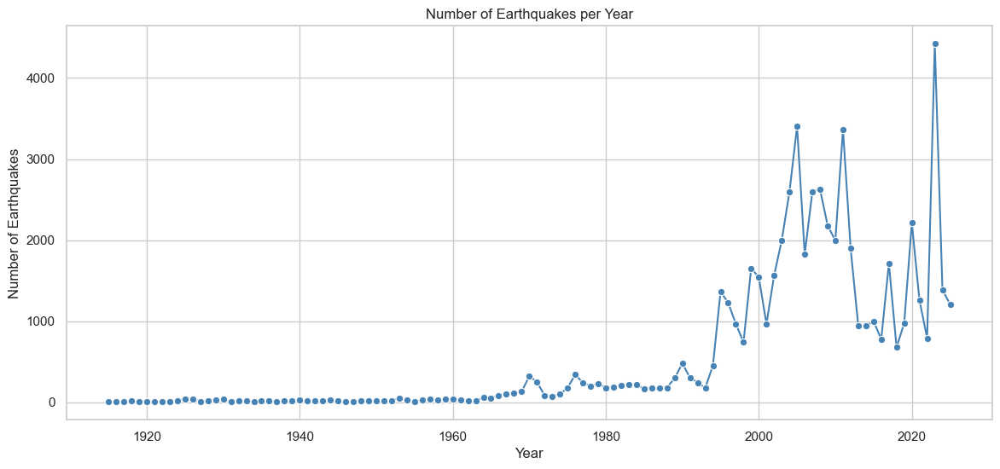

In [44]:
# === Style Seaborn ===
sns.set(style="whitegrid")

# Extract Year
df["Year"] = df["Datetime"].dt.year
df["Year"] = df["Year"].astype(int)

# Group and count earthquakes per year
yearly_counts = df.groupby("Year").size().reset_index(name="Count")

# Seaborn Lineplot
sns.set(style="whitegrid")
plt.figure(figsize=(14, 6))
sns.lineplot(data=yearly_counts, x="Year", y="Count", marker="o", color="steelblue")
plt.title("Number of Earthquakes per Year")
plt.xlabel("Year")
plt.ylabel("Number of Earthquakes")
plt.grid(True)
plt.show()

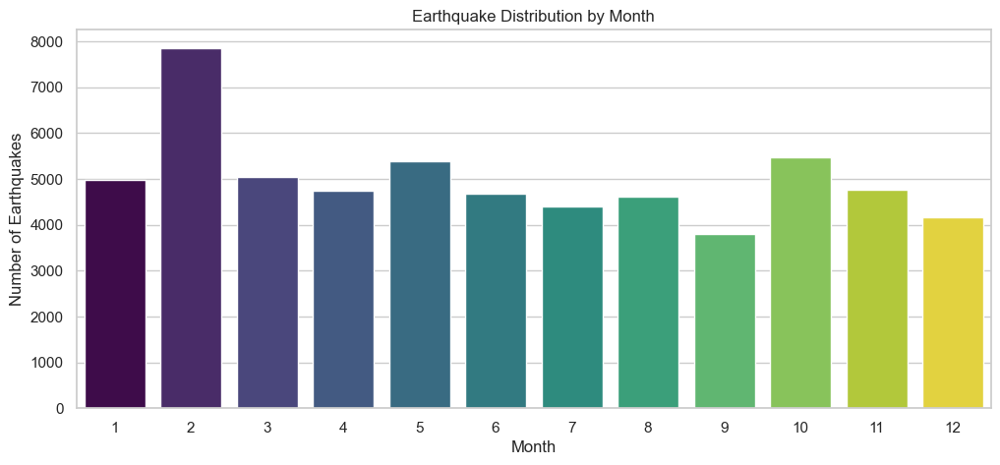

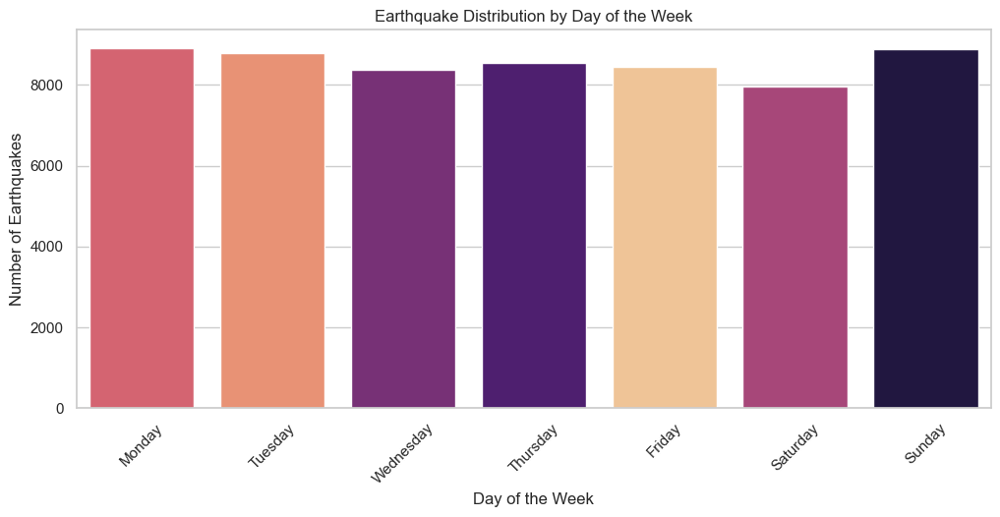

In [45]:
# Earthquake distribution by month (Seaborn)
df["Month"] = df["Datetime"].dt.month
plt.figure(figsize=(12, 5))
sns.countplot(data=df, x="Month", palette="viridis", hue="Month", legend=False)
plt.title("Earthquake Distribution by Month")
plt.xlabel("Month")
plt.ylabel("Number of Earthquakes")
plt.show()

# Earthquake distribution by day of the week (Seaborn)
df["Weekday"] = df["Datetime"].dt.day_name()
plt.figure(figsize=(12, 5))
order_days = [
    "Monday",
    "Tuesday",
    "Wednesday",
    "Thursday",
    "Friday",
    "Saturday",
    "Sunday",
]
sns.countplot(data=df, x="Weekday", order=order_days, palette="magma", hue="Weekday")
plt.title("Earthquake Distribution by Day of the Week")
plt.xlabel("Day of the Week")
plt.ylabel("Number of Earthquakes")
plt.xticks(rotation=45)
plt.show()

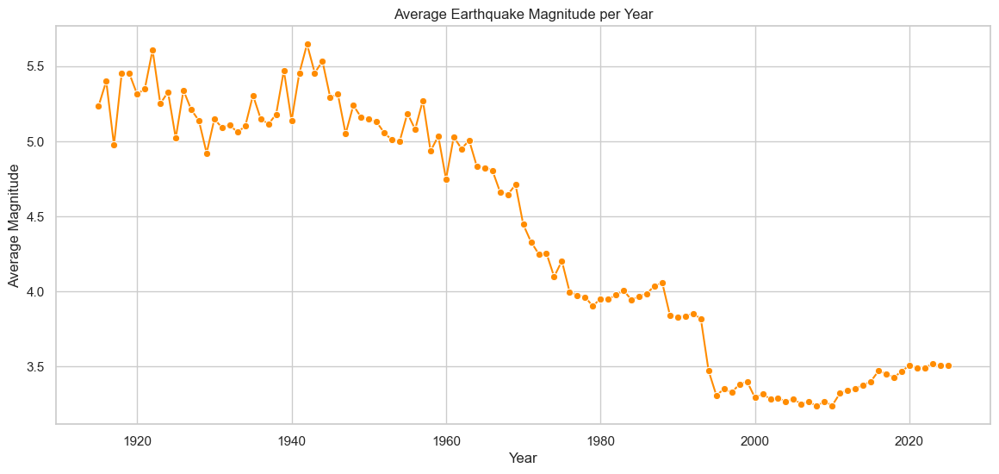

In [46]:
# Evolution of average magnitude per year with Seaborn
yearly_magnitude = df.groupby("Year")["Magnitude"].mean().reset_index()

plt.figure(figsize=(14, 6))
sns.lineplot(
    data=yearly_magnitude, x="Year", y="Magnitude", marker="o", color="darkorange"
)
plt.title("Average Earthquake Magnitude per Year")
plt.xlabel("Year")
plt.ylabel("Average Magnitude")
plt.grid(True)
plt.show()

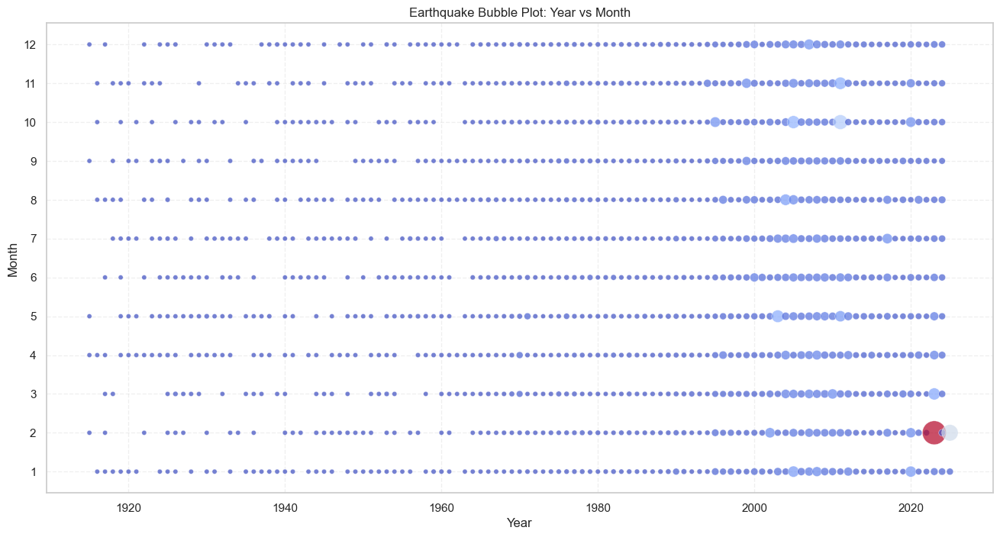

In [48]:
# Group by Year-Month
grouped = df.groupby(["Year", "Month"]).size().reset_index(name="Count")

# Normalize bubble size for better visuals
grouped["Size"] = (
    grouped["Count"] / grouped["Count"].max()
) * 500  # Adjust scale factor if needed

# Plot Bubble Chart
plt.figure(figsize=(16, 8))
sns.scatterplot(
    data=grouped,
    x="Year",
    y="Month",
    size="Size",
    hue="Count",
    sizes=(20, 500),
    palette="coolwarm",
    alpha=0.7,
    legend=False,
)

plt.title("Earthquake Bubble Plot: Year vs Month")
plt.xlabel("Year")
plt.ylabel("Month")
plt.yticks(range(1, 13))
plt.grid(True, linestyle="--", alpha=0.3)
plt.show()

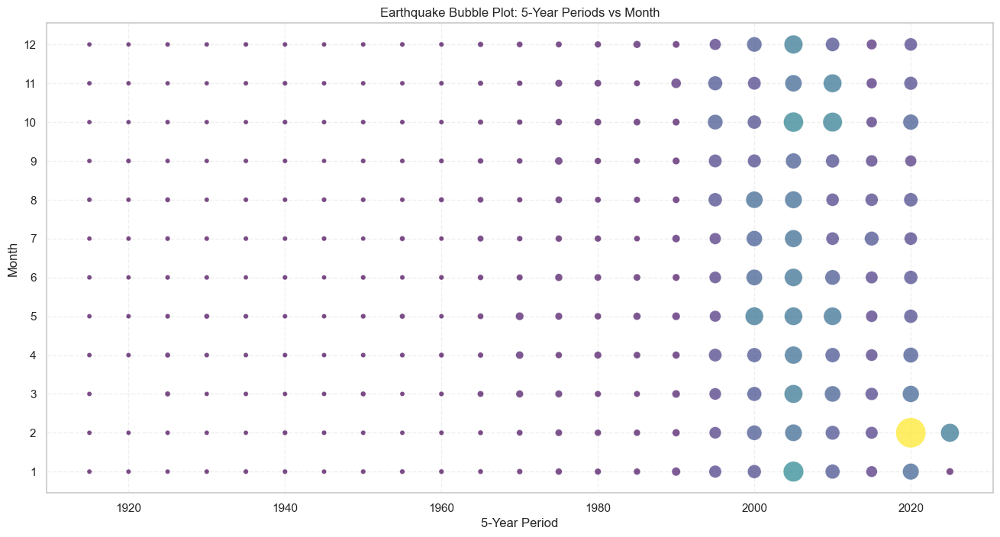

In [49]:
# Create 'Period' column (quinquenios)
df["Period"] = (df["Year"] // 5) * 5

# Group by Period and Month
grouped = df.groupby(["Period", "Month"]).size().reset_index(name="Count")

# Normalize bubble size
grouped["Size"] = (
    grouped["Count"] / grouped["Count"].max()
) * 800  # You can tweak scale

# Plot Bubble Chart
plt.figure(figsize=(16, 8))
sns.scatterplot(
    data=grouped,
    x="Period",
    y="Month",
    size="Size",
    hue="Count",
    sizes=(20, 800),
    palette="viridis",
    alpha=0.7,
    legend=False,
)

plt.title("Earthquake Bubble Plot: 5-Year Periods vs Month")
plt.xlabel("5-Year Period")
plt.ylabel("Month")
plt.yticks(range(1, 13))
plt.grid(True, linestyle="--", alpha=0.3)
plt.show()

In [50]:
def get_season(month):
    if month in [12, 1, 2]:
        return "Winter"
    elif month in [3, 4, 5]:
        return "Spring"
    elif month in [6, 7, 8]:
        return "Summer"
    else:
        return "Autumn"


df["Season"] = df["Month"].apply(get_season)

In [51]:
df.head()

,No,Earthquake Code,Date,Time,Latitude,Longitude,Depth,Magnitude,Location,Datetime,Year,Month,Weekday,Period,Season
0,1,1915021408200060,1915.02.14,08:20:00.60,38.80,42.50,30.0,5.7,CEMALETTIN-AHLAT (BITLIS) [South West 3.7 km],1915-02-14 08:20:00.600,1915,2,Sunday,1915,Winter
1,2,1915022812470240,1915.02.28,12:47:02.40,37.70,43.10,30.0,5.5,MEZRA-BEYTUSSEBAP (SIRNAK) [North West 9.0 km],1915-02-28 12:47:02.400,1915,2,Sunday,1915,Winter
2,3,1915040105410500,1915.04.01,05:41:05.00,40.50,44.50,35.0,4.9,AZERBAYCAN,1915-04-01 05:41:05.000,1915,4,Thursday,1915,Spring
3,4,1915051904480240,1915.05.19,04:48:02.40,37.62,39.47,10.0,5.5,CATLI-SIVEREK (SANLIURFA) [South East 3.5 km],1915-05-19 04:48:02.400,1915,5,Wednesday,1915,Spring
4,5,1915092307200100,1915.09.23,07:20:01.00,40.00,43.00,15.0,4.4,EVYAPAN-KAGIZMAN (KARS) [South West 5.8 km],1915-09-23 07:20:01.000,1915,9,Thursday,1915,Autumn


In [52]:
season_counts = (
    df["Season"].value_counts().reindex(["Winter", "Spring", "Summer", "Autumn"])
)

In [53]:
season_counts.head()

Season
Winter    17007
Spring    15177
Summer    13710
Autumn    14047
Name: count, dtype: int64

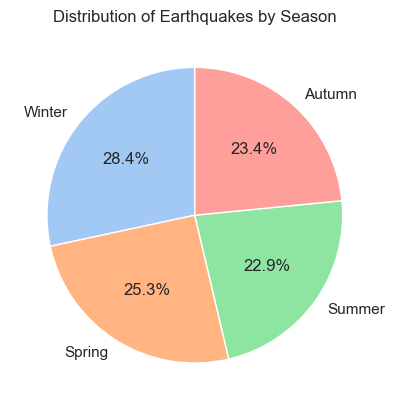

In [54]:
season_counts.plot.pie(
    autopct="%1.1f%%", colors=sns.color_palette("pastel"), startangle=90
)
plt.title("Distribution of Earthquakes by Season")
plt.ylabel("")
plt.show()

C:\Users\pikel\AppData\Local\Temp\ipykernel_2870452\1847343778.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=season_counts.index, y=season_counts.values, palette="pastel")


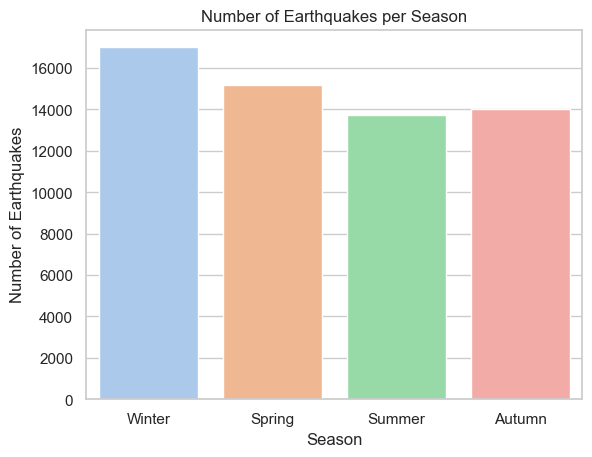

In [55]:
sns.barplot(x=season_counts.index, y=season_counts.values, palette="pastel")
plt.title("Number of Earthquakes per Season")
plt.ylabel("Number of Earthquakes")
plt.xlabel("Season")
plt.show()

In [56]:
# Histograma o KDE de Magnitudes por Décadas (cómo ha evolucionado la magnitud de los terremotos a lo largo de las décadas)

In [57]:
df["Decade"] = (df["Year"] // 10) * 10

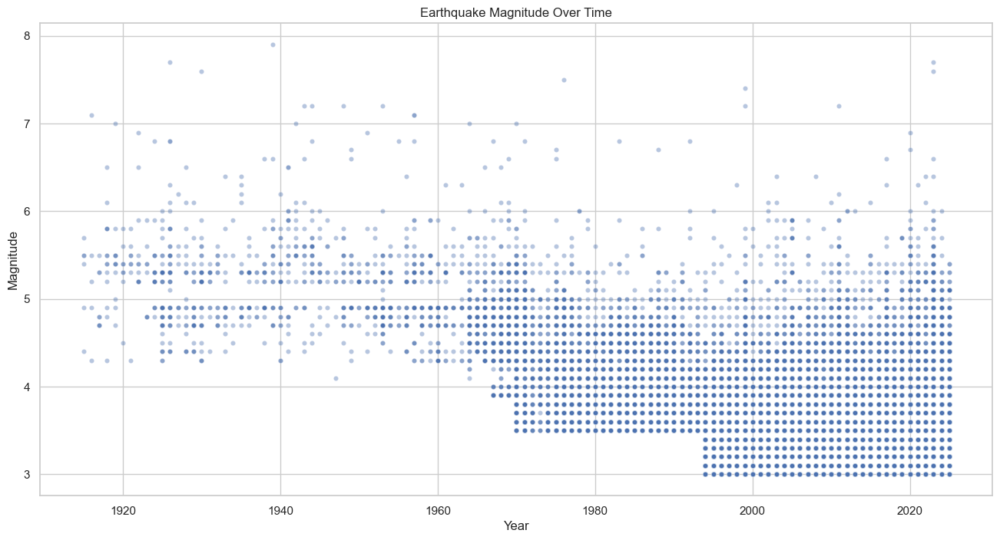

In [58]:
plt.figure(figsize=(16, 8))
sns.scatterplot(data=df, x="Year", y="Magnitude", alpha=0.4, s=20)
plt.title("Earthquake Magnitude Over Time")
plt.xlabel("Year")
plt.ylabel("Magnitude")
plt.grid(True)
plt.show()

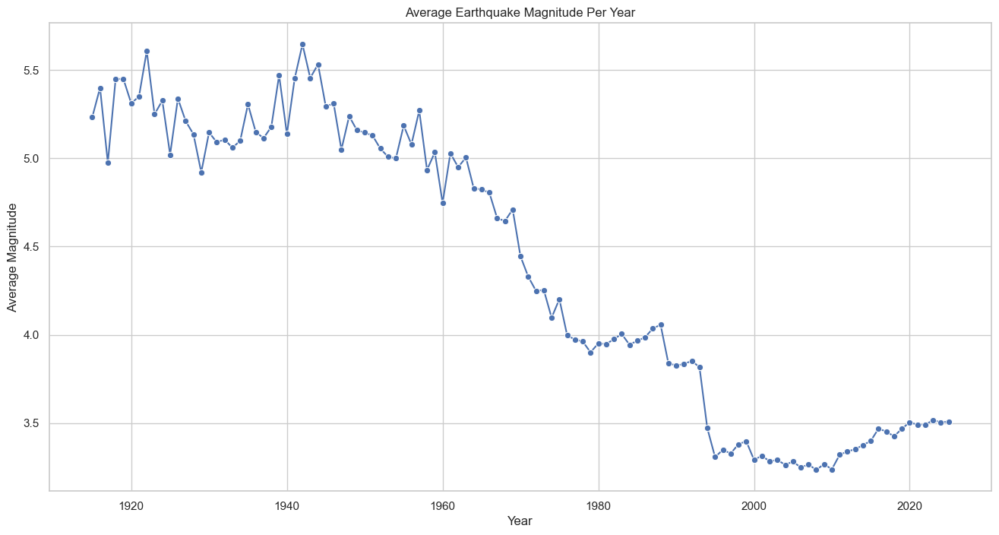

In [59]:
# Group by Year
yearly_avg = df.groupby("Year")["Magnitude"].mean().reset_index()

plt.figure(figsize=(16, 8))
sns.lineplot(data=yearly_avg, x="Year", y="Magnitude", marker="o")
plt.title("Average Earthquake Magnitude Per Year")
plt.xlabel("Year")
plt.ylabel("Average Magnitude")
plt.grid(True)
plt.show()

In [60]:
# Relación entre profundiadd, magnitud y año:

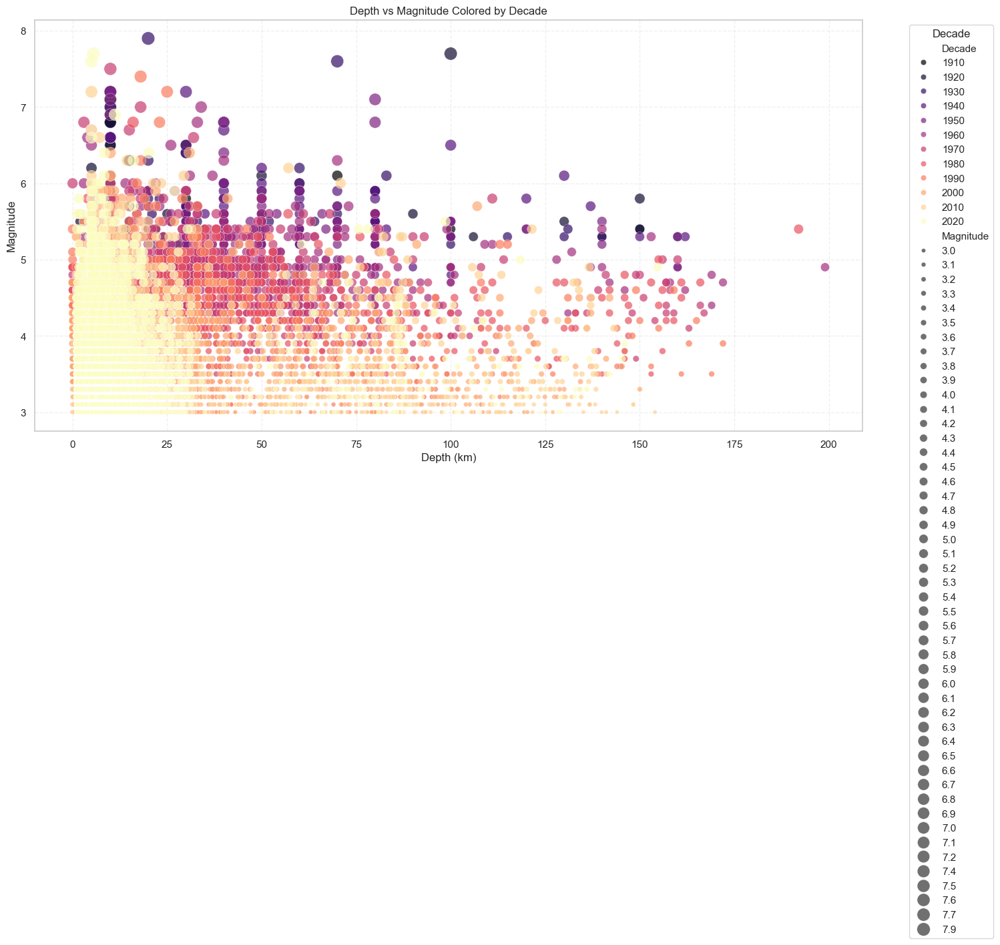

In [62]:
# Plot
plt.figure(figsize=(16, 8))
scatter = sns.scatterplot(
    data=df,
    x="Depth",
    y="Magnitude",
    hue="Decade",
    palette="magma",
    alpha=0.7,
    size="Magnitude",
    sizes=(20, 200),
    legend="full",
)

plt.title("Depth vs Magnitude Colored by Decade")
plt.xlabel("Depth (km)")
plt.ylabel("Magnitude")
plt.grid(True, linestyle="--", alpha=0.3)
plt.legend(title="Decade", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.show()

In [63]:
# Agrupar por categorías geológicas de profundidad:
# Shallow: 0–70 km

# Intermediate: 70–300 km

# Deep: >300 km

In [64]:
def depth_category(depth):
    if depth <= 70:
        return "Shallow"
    elif depth <= 300:
        return "Intermediate"
    else:
        return "Deep"


df["Depth Category"] = df["Depth"].apply(depth_category)

In [65]:
df.head()

,No,Earthquake Code,Date,Time,Latitude,Longitude,Depth,Magnitude,Location,Datetime,Year,Month,Weekday,Period,Season,Decade,Depth Category
0,1,1915021408200060,1915.02.14,08:20:00.60,38.80,42.50,30.0,5.7,CEMALETTIN-AHLAT (BITLIS) [South West 3.7 km],1915-02-14 08:20:00.600,1915,2,Sunday,1915,Winter,1910,Shallow
1,2,1915022812470240,1915.02.28,12:47:02.40,37.70,43.10,30.0,5.5,MEZRA-BEYTUSSEBAP (SIRNAK) [North West 9.0 km],1915-02-28 12:47:02.400,1915,2,Sunday,1915,Winter,1910,Shallow
2,3,1915040105410500,1915.04.01,05:41:05.00,40.50,44.50,35.0,4.9,AZERBAYCAN,1915-04-01 05:41:05.000,1915,4,Thursday,1915,Spring,1910,Shallow
3,4,1915051904480240,1915.05.19,04:48:02.40,37.62,39.47,10.0,5.5,CATLI-SIVEREK (SANLIURFA) [South East 3.5 km],1915-05-19 04:48:02.400,1915,5,Wednesday,1915,Spring,1910,Shallow
4,5,1915092307200100,1915.09.23,07:20:01.00,40.00,43.00,15.0,4.4,EVYAPAN-KAGIZMAN (KARS) [South West 5.8 km],1915-09-23 07:20:01.000,1915,9,Thursday,1915,Autumn,1910,Shallow


C:\Users\pikel\AppData\Local\Temp\ipykernel_2870452\3919876127.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x="Depth Category", palette="coolwarm")


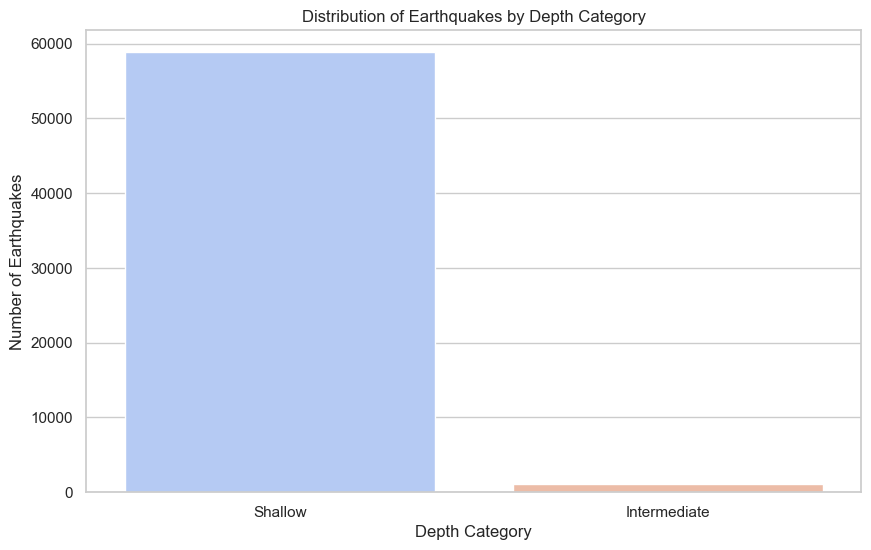

In [66]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x="Depth Category", palette="coolwarm")
plt.title("Distribution of Earthquakes by Depth Category")
plt.ylabel("Number of Earthquakes")
plt.xlabel("Depth Category")
plt.show()

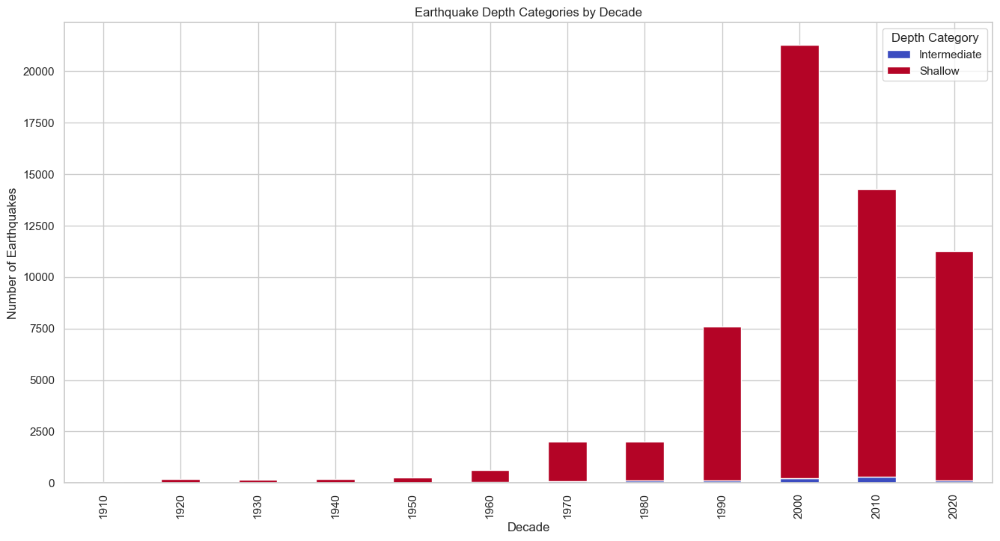

In [67]:
# Agrupar por Decade + Depth Category
depth_decade = df.groupby(["Decade", "Depth Category"]).size().unstack().fillna(0)

# Plot Stacked Bar
depth_decade.plot(kind="bar", stacked=True, figsize=(16, 8), colormap="coolwarm")
plt.title("Earthquake Depth Categories by Decade")
plt.ylabel("Number of Earthquakes")
plt.xlabel("Decade")
plt.legend(title="Depth Category")
plt.show()

In [70]:
import plotly.express as px

plt.figure(figsize=(15, 15))
fig = px.density_mapbox(
    df,
    lat="Latitude",
    lon="Longitude",
    z="Magnitude",
    radius=8,
    center=dict(lat=39, lon=35),
    zoom=5,
    mapbox_style="carto-positron",
    color_continuous_scale="YlOrRd",
)

fig.update_layout(
    title="Earthquake Density Heatmap - Turkey", height=900  # Aumenta la altura
)
fig.show()

<Figure size 1500x1500 with 0 Axes>

In [71]:
import plotly.express as px
import plotly.graph_objects as go

# Suponiendo que 'df' es tu DataFrame con datos de terremotos
fig = px.density_mapbox(
    df,
    lat="Latitude",
    lon="Longitude",
    z="Magnitude",
    radius=8,
    center=dict(lat=39, lon=35),
    zoom=5,
    mapbox_style="carto-positron",
    color_continuous_scale="YlOrRd",
)

# Coordenadas de la Falla de Anatolia del Norte (NAF)
naf_latitudes = [39.3, 40.0, 40.5, 40.7]
naf_longitudes = [40.0, 38.5, 28.0, 27.0]

# Coordenadas de la Falla de Anatolia Oriental (EAF)
eaf_latitudes = [37.0, 38.0, 39.0, 39.3]
eaf_longitudes = [37.0, 38.0, 39.0, 40.0]

# Añadir la Falla de Anatolia del Norte al mapa
fig.add_trace(
    go.Scattermapbox(
        mode="lines",
        lon=naf_longitudes,
        lat=naf_latitudes,
        line=dict(width=2, color="blue"),
        name="North Anatolian Fault",
    )
)

# Añadir la Falla de Anatolia Oriental al mapa
fig.add_trace(
    go.Scattermapbox(
        mode="lines",
        lon=eaf_longitudes,
        lat=eaf_latitudes,
        line=dict(width=2, color="green"),
        name="East Anatolian Fault",
    )
)

fig.update_layout(
    title="Earthquake Density Map of Türkiye with Tectonic Faults", height=900
)

fig.show()

In [73]:
import pandas as pd
import plotly.graph_objects as go

# === 1️⃣ Filtrar top 20 terremotos ===
top20 = df.nlargest(20, "Magnitude").copy().reset_index(drop=True)

# Extraer año (si no lo tienes ya)
top20["Year"] = pd.to_datetime(top20["Datetime"]).dt.year

# Paleta fija de colores
fixed_colors = [
    "#e6194b",
    "#3cb44b",
    "#ffe119",
    "#4363d8",
    "#f58231",
    "#911eb4",
    "#46f0f0",
    "#f032e6",
    "#bcf60c",
    "#fabebe",
    "#008080",
    "#e6beff",
    "#9a6324",
    "#fffac8",
    "#800000",
    "#aaffc3",
    "#808000",
    "#ffd8b1",
    "#000075",
    "#808080",
]

# === 2️⃣ Crear figura base ===
fig = go.Figure()

# === 3️⃣ Añadir líneas de fallas tectónicas ===
naf_latitudes = [39.3, 40.0, 40.5, 40.7]
naf_longitudes = [40.0, 38.5, 28.0, 27.0]

fig.add_trace(
    go.Scattermapbox(
        mode="lines",
        lon=naf_longitudes,
        lat=naf_latitudes,
        line=dict(width=2, color="blue"),
        name="North Anatolian Fault",
    )
)

eaf_latitudes = [37.0, 38.0, 39.0, 39.3]
eaf_longitudes = [37.0, 38.0, 39.0, 40.0]

fig.add_trace(
    go.Scattermapbox(
        mode="lines",
        lon=eaf_longitudes,
        lat=eaf_latitudes,
        line=dict(width=2, color="green"),
        name="East Anatolian Fault",
    )
)

# === 4️⃣ Añadir burbujas con colores fijos ===
for i, row in top20.iterrows():
    fig.add_trace(
        go.Scattermapbox(
            mode="markers",
            lon=[row["Longitude"]],
            lat=[row["Latitude"]],
            marker=go.scattermapbox.Marker(
                size=row["Magnitude"] * 4,
                color=fixed_colors[i % len(fixed_colors)],  # Para evitar error
                opacity=0.9,
            ),
            name=f"Mag {row['Magnitude']} ({row['Year']})",
            text=f"Magnitude: {row['Magnitude']}<br>Year: {row['Year']}",
            hoverinfo="text",
        )
    )

# === 5️⃣ Configuración general ===
fig.update_layout(
    mapbox=dict(style="carto-positron", center=dict(lat=39, lon=35), zoom=5),
    height=900,
    title="Top 20 Strongest Earthquakes with Fixed Colors & Fault Lines",
    showlegend=True,
)

fig.show()

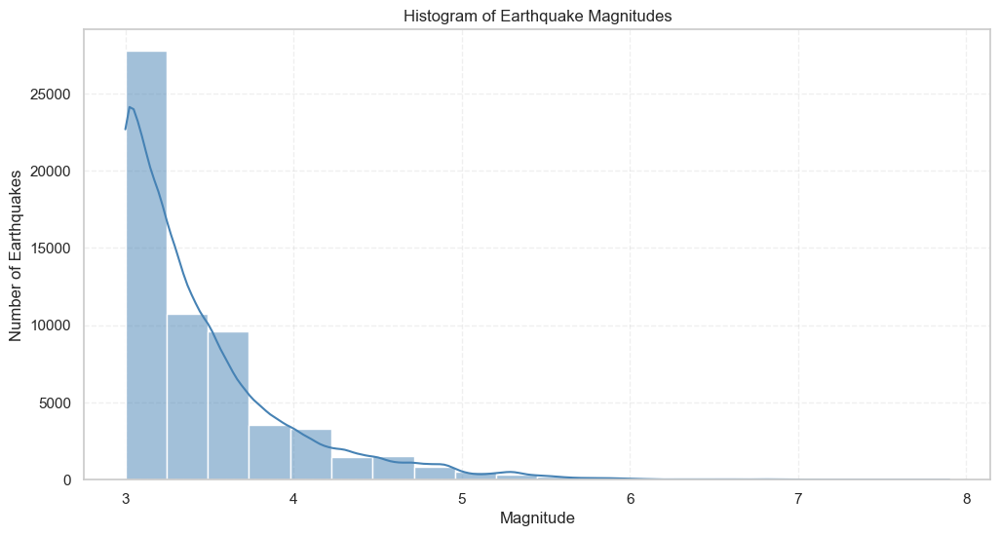

In [74]:
plt.figure(figsize=(12, 6))
sns.histplot(data=df, x="Magnitude", bins=20, kde=True, color="steelblue")
plt.title("Histogram of Earthquake Magnitudes")
plt.xlabel("Magnitude")
plt.ylabel("Number of Earthquakes")
plt.grid(True, linestyle="--", alpha=0.3)
plt.show()

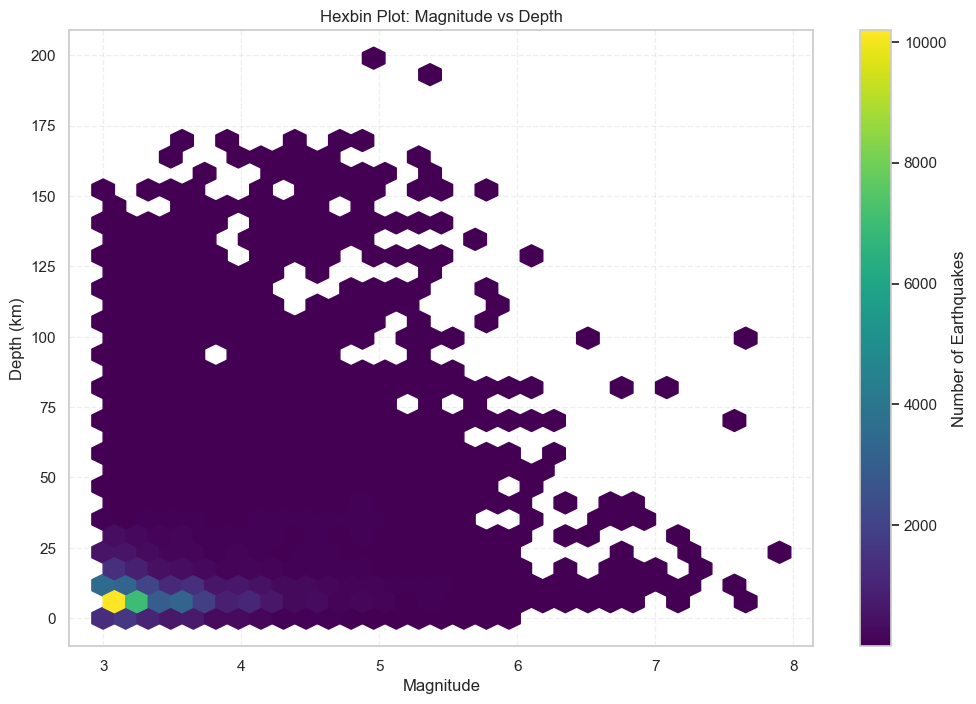

In [75]:
plt.figure(figsize=(12, 8))
plt.hexbin(df["Magnitude"], df["Depth"], gridsize=30, cmap="viridis", mincnt=1)
plt.colorbar(label="Number of Earthquakes")
plt.xlabel("Magnitude")
plt.ylabel("Depth (km)")
plt.title("Hexbin Plot: Magnitude vs Depth")
plt.grid(True, linestyle="--", alpha=0.3)
plt.show()

In [ ]:
#  -----------------------------------------------------------------------------------
#  ----------------    ANALISIS DE PATRONES DIAS PREVIOS MAYORES 30 TERREMOTOS  -------------------------------------
#  -----------------------------------------------------------------------------------

In [158]:
df.head()

,No,Earthquake Code,Date,Time,Latitude,Longitude,Depth,Magnitude,Location,Datetime,Year,Month,Weekday,Period,Season,Decade,Depth Category
0,1,1915021408200060,1915.02.14,08:20:00.60,38.80,42.50,30.0,5.7,CEMALETTIN-AHLAT (BITLIS) [South West 3.7 km],1915-02-14 08:20:00.600,1915,2,Sunday,1915,Winter,1910,Shallow
1,2,1915022812470240,1915.02.28,12:47:02.40,37.70,43.10,30.0,5.5,MEZRA-BEYTUSSEBAP (SIRNAK) [North West 9.0 km],1915-02-28 12:47:02.400,1915,2,Sunday,1915,Winter,1910,Shallow
2,3,1915040105410500,1915.04.01,05:41:05.00,40.50,44.50,35.0,4.9,AZERBAYCAN,1915-04-01 05:41:05.000,1915,4,Thursday,1915,Spring,1910,Shallow
3,4,1915051904480240,1915.05.19,04:48:02.40,37.62,39.47,10.0,5.5,CATLI-SIVEREK (SANLIURFA) [South East 3.5 km],1915-05-19 04:48:02.400,1915,5,Wednesday,1915,Spring,1910,Shallow
4,5,1915092307200100,1915.09.23,07:20:01.00,40.00,43.00,15.0,4.4,EVYAPAN-KAGIZMAN (KARS) [South West 5.8 km],1915-09-23 07:20:01.000,1915,9,Thursday,1915,Autumn,1910,Shallow


In [160]:
top30_quakes = df.sort_values(by="Magnitude", ascending=False).head(30)

In [171]:
from datetime import timedelta

# Creamos lista para almacenar datos previos
previous_quakes = []

# Recorremos cada uno de los 30 terremotos grandes
for index, row in top30_quakes.iterrows():
    event_date = row["Datetime"]
    start_date = event_date - timedelta(
        days=14
    )  # prueba con 14 días previos a cada terremoto

    # Filtramos eventos previos
    mask = (df["Datetime"] >= start_date) & (df["Datetime"] < event_date)
    subset = df.loc[mask].copy()
    subset["Target_Event"] = f"{row['Date']} - Mag: {row['Magnitude']}"
    previous_quakes.append(subset)

# Unimos todos los registros previos
previous_quakes_df = pd.concat(previous_quakes, ignore_index=True)

In [179]:
previous_quakes_df.head()

,No,Earthquake Code,Date,Time,Latitude,Longitude,Depth,Magnitude,Location,Datetime,Year,Month,Weekday,Period,Season,Decade,Depth Category,Target_Event
0,53045,2023012312221727,2023.01.23,12:22:17.27,39.3788,26.2415,12.9,3.3,MIDILLI ADASI (EGE DENIZI),2023-01-23 12:22:17.270,2023,1,Monday,2020,Winter,2020,Shallow,2023.02.06 - Mag: 7.7
1,53046,2023012320372084,2023.01.23,20:37:20.84,36.8335,27.4510,7.2,3.2,GOKOVA KORFEZI (AKDENIZ),2023-01-23 20:37:20.840,2023,1,Monday,2020,Winter,2020,Shallow,2023.02.06 - Mag: 7.7
2,53047,2023012400484819,2023.01.24,00:48:48.19,39.3633,26.2825,7.1,4.0,MIDILLI ADASI (EGE DENIZI),2023-01-24 00:48:48.190,2023,1,Tuesday,2020,Winter,2020,Shallow,2023.02.06 - Mag: 7.7
3,53048,2023012401473035,2023.01.24,01:47:30.35,39.4345,26.3597,11.4,3.4,EDREMIT KORFEZI (EGE DENIZI),2023-01-24 01:47:30.350,2023,1,Tuesday,2020,Winter,2020,Shallow,2023.02.06 - Mag: 7.7
4,53049,2023012402045896,2023.01.24,02:04:58.96,39.3618,26.2655,6.8,3.4,MIDILLI ADASI (EGE DENIZI),2023-01-24 02:04:58.960,2023,1,Tuesday,2020,Winter,2020,Shallow,2023.02.06 - Mag: 7.7


In [181]:
# Número total de terremotos previos por gran evento
quake_counts = (
    previous_quakes_df.groupby("Target_Event")
    .size()
    .reset_index(name="Num_Earthquakes")
)
print(quake_counts)

             Target_Event  Num_Earthquakes
0   1922.08.13 - Mag: 6.9                1
1   1924.09.13 - Mag: 6.8                2
2   1926.03.18 - Mag: 6.8                7
3   1930.05.06 - Mag: 7.6                1
4   1942.12.20 - Mag: 7.0                1
5   1943.11.26 - Mag: 7.2                2
6   1951.08.13 - Mag: 6.9                1
7   1957.04.25 - Mag: 7.1                2
8   1964.10.06 - Mag: 7.0                3
9   1967.07.22 - Mag: 6.8                1
10  1970.03.28 - Mag: 7.0                3
11  1971.05.22 - Mag: 6.8               67
12  1976.11.24 - Mag: 7.5               24
13  1983.10.30 - Mag: 6.8               16
14  1999.08.17 - Mag: 7.4               17
15  1999.11.12 - Mag: 7.2               57
16  2011.10.23 - Mag: 7.2               50
17  2020.10.30 - Mag: 6.9               34
18  2023.02.06 - Mag: 7.6              313
19  2023.02.06 - Mag: 7.7               50


In [183]:
# Magnitud media, máxima y mínima de los terremotos durante los 14 días previos a cada uno de los mayores 30 terremotos:
mag_stats = (
    previous_quakes_df.groupby("Target_Event")["Magnitude"]
    .agg(["mean", "max", "min"])
    .reset_index()
)
print(mag_stats)

             Target_Event      mean  max  min
0   1922.08.13 - Mag: 6.9  6.500000  6.5  6.5
1   1924.09.13 - Mag: 6.8  5.250000  5.3  5.2
2   1926.03.18 - Mag: 6.8  5.742857  6.8  4.8
3   1930.05.06 - Mag: 7.6  5.600000  5.6  5.6
4   1942.12.20 - Mag: 7.0  5.900000  5.9  5.9
5   1943.11.26 - Mag: 7.2  5.500000  5.6  5.4
6   1951.08.13 - Mag: 6.9  4.800000  4.8  4.8
7   1957.04.25 - Mag: 7.1  5.850000  6.8  4.9
8   1964.10.06 - Mag: 7.0  4.900000  5.7  4.5
9   1967.07.22 - Mag: 6.8  5.300000  5.3  5.3
10  1970.03.28 - Mag: 7.0  4.000000  4.3  3.5
11  1971.05.22 - Mag: 6.8  4.326866  5.9  3.5
12  1976.11.24 - Mag: 7.5  3.850000  4.9  3.5
13  1983.10.30 - Mag: 6.8  3.775000  4.9  3.5
14  1999.08.17 - Mag: 7.4  3.229412  3.7  3.0
15  1999.11.12 - Mag: 7.2  3.452632  5.7  3.0
16  2011.10.23 - Mag: 7.2  3.234000  4.4  3.0
17  2020.10.30 - Mag: 6.9  3.391176  4.5  3.0
18  2023.02.06 - Mag: 7.6  3.791054  7.7  3.0
19  2023.02.06 - Mag: 7.7  3.482000  5.9  3.0


In [185]:
# Resúmenes
summary_df = pd.merge(quake_counts, mag_stats, on="Target_Event")
summary_df

,Target_Event,Num_Earthquakes,mean,max,min
0,1922.08.13 - Mag: 6.9,1,6.500000,6.5,6.5
1,1924.09.13 - Mag: 6.8,2,5.250000,5.3,5.2
2,1926.03.18 - Mag: 6.8,7,5.742857,6.8,4.8
3,1930.05.06 - Mag: 7.6,1,5.600000,5.6,5.6
4,1942.12.20 - Mag: 7.0,1,5.900000,5.9,5.9
5,1943.11.26 - Mag: 7.2,2,5.500000,5.6,5.4
6,1951.08.13 - Mag: 6.9,1,4.800000,4.8,4.8
7,1957.04.25 - Mag: 7.1,2,5.850000,6.8,4.9
8,1964.10.06 - Mag: 7.0,3,4.900000,5.7,4.5
9,1967.07.22 - Mag: 6.8,1,5.300000,5.3,5.3


C:\Users\pikel\AppData\Local\Temp\ipykernel_2870452\11204901.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



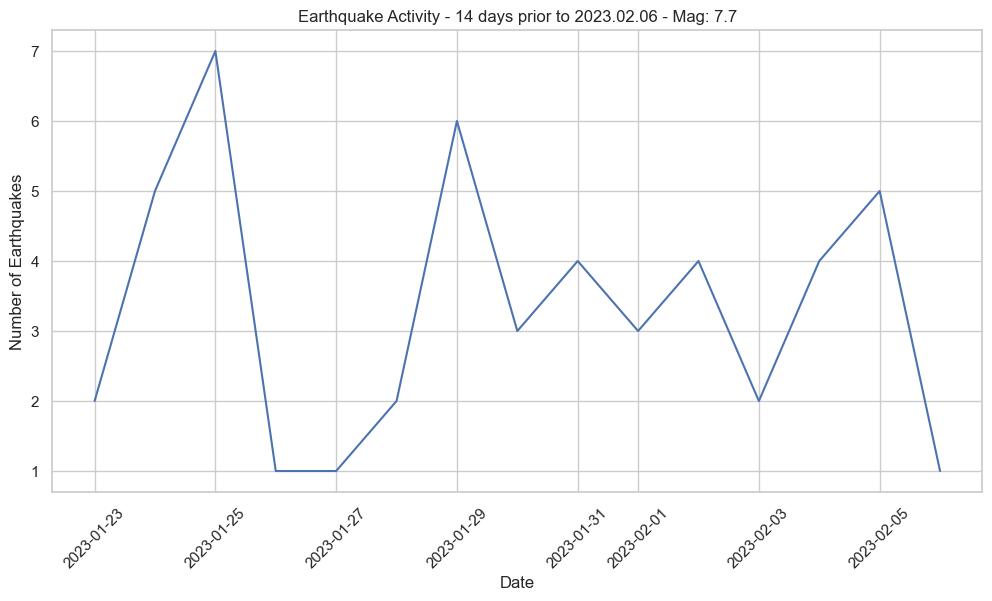

In [187]:
# Seleccionar un terremoto grande para visualizar
selected_event = previous_quakes_df["Target_Event"].unique()[
    0
]  # Esta visualización es para un único terremoto, el posición [0] de la lista top
event_data = previous_quakes_df[previous_quakes_df["Target_Event"] == selected_event]

# Agrupar por día
event_data["Day"] = event_data["Datetime"].dt.date
daily_counts = event_data.groupby("Day").size().reset_index(name="Num_Earthquakes")

plt.figure(figsize=(12, 6))
sns.lineplot(data=daily_counts, x="Day", y="Num_Earthquakes")
plt.title(f"Earthquake Activity - 14 days prior to {selected_event}")
plt.xlabel("Date")
plt.ylabel("Number of Earthquakes")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

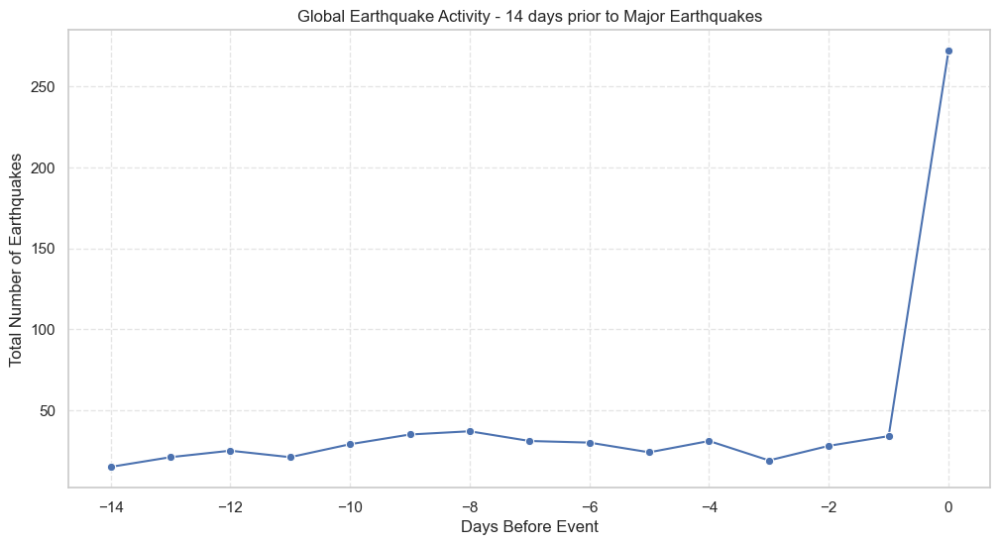

In [189]:
# visualización de la actividad de los 30 terremotos:

# Calcular día relativo
previous_quakes_df["Day_Relative"] = (
    previous_quakes_df["Datetime"]
    - pd.to_datetime(previous_quakes_df["Target_Event"].str.split(" - ").str[0])
).dt.days

# Ahora, Day_Relative será de -14 a -1 (los días previos)

# Agrupar: Número total de terremotos por día relativo
activity = (
    previous_quakes_df.groupby("Day_Relative")
    .size()
    .reset_index(name="Num_Earthquakes")
)

# Visualización global
plt.figure(figsize=(12, 6))
sns.lineplot(data=activity, x="Day_Relative", y="Num_Earthquakes", marker="o")
plt.title("Global Earthquake Activity - 14 days prior to Major Earthquakes")
plt.xlabel("Days Before Event")
plt.ylabel("Total Number of Earthquakes")
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

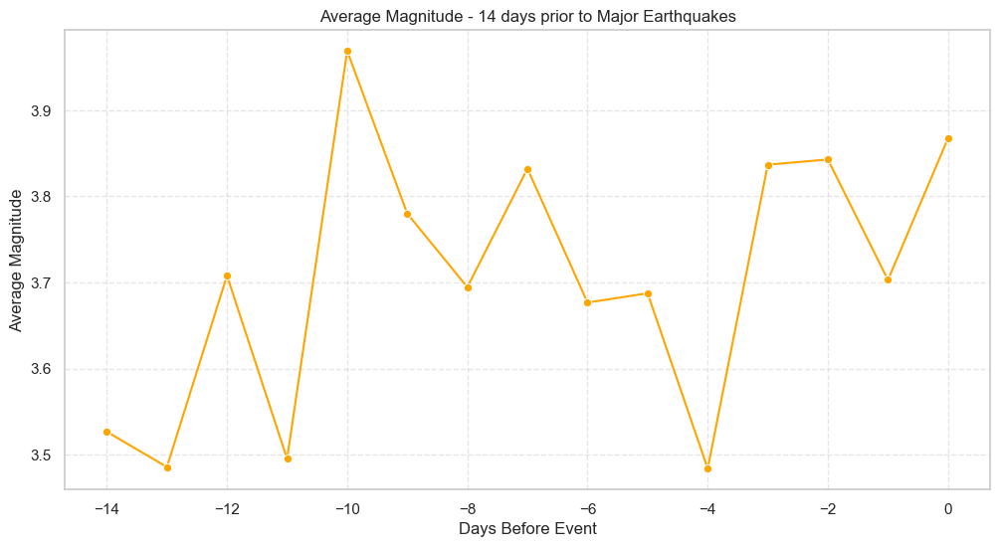

In [191]:
# Magnitud media por día relativo:

mag_avg = previous_quakes_df.groupby("Day_Relative")["Magnitude"].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(data=mag_avg, x="Day_Relative", y="Magnitude", marker="o", color="orange")
plt.title("Average Magnitude - 14 days prior to Major Earthquakes")
plt.xlabel("Days Before Event")
plt.ylabel("Average Magnitude")
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

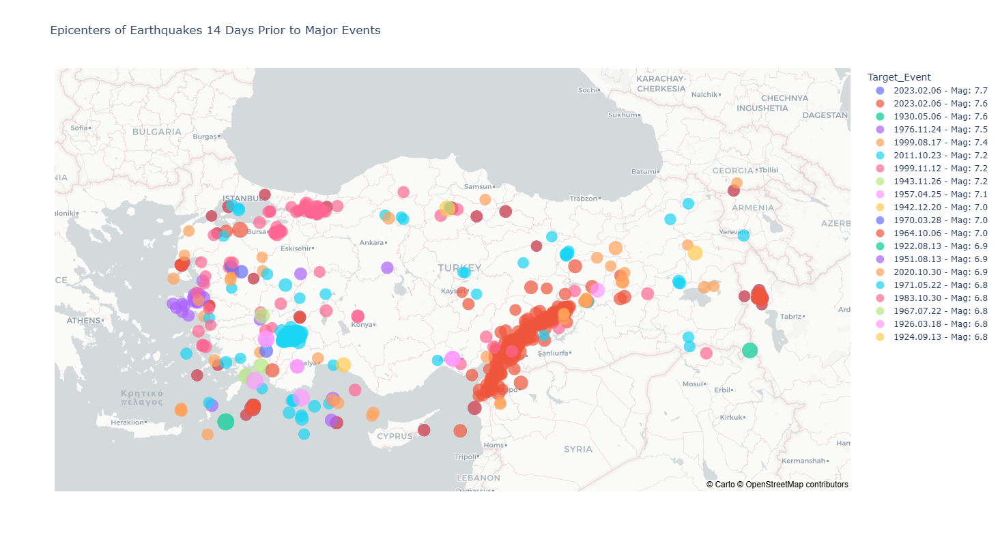

In [195]:
# Mapa de Epicentros Previos:

fig = px.scatter_mapbox(
    previous_quakes_df,
    lat="Latitude",
    lon="Longitude",
    color="Target_Event",  # Diferente color por gran evento
    size="Magnitude",
    hover_name="Target_Event",
    hover_data={"Magnitude": True, "Depth": True},
    zoom=5,
    center={"lat": 39, "lon": 35},
    height=800,
    mapbox_style="carto-positron",
    title="Epicenters of Earthquakes 14 Days Prior to Major Events",
)

fig.show()

In [ ]:
#  ----- Modelo  K-MEANS  (CLUSTERING) ------

In [197]:
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.cluster import KMeans

# Solo usamos Lat y Lon
X = df[["Latitude", "Longitude"]]

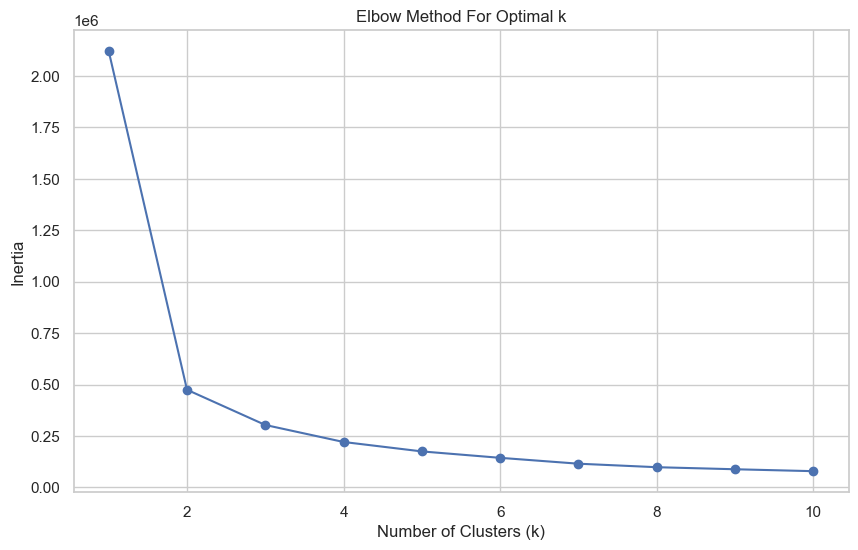

In [199]:
# Método del Codo - Para decidir cuántos clusters

inertia = []
K = range(1, 11)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(K, inertia, "bo-")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method For Optimal k")
plt.grid(True)
plt.show()

In [ ]:
# Según la gráfica, el “codo” más evidente ocurre en k = 2, porque es donde la inercia baja drásticamente y luego empieza a estabilizarse. Matemáticamente, ahí sería óptimo.

# PERO

# Como estamos hablando de un contexto geográfico y buscamos zonas calientes y patrones visuales claros, muchas veces se justifica probar también con:

# k = 3 o 4 para dar más detalle sin sobrecargar.

In [232]:
k = 6
kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
df["Cluster"] = kmeans.fit_predict(X)

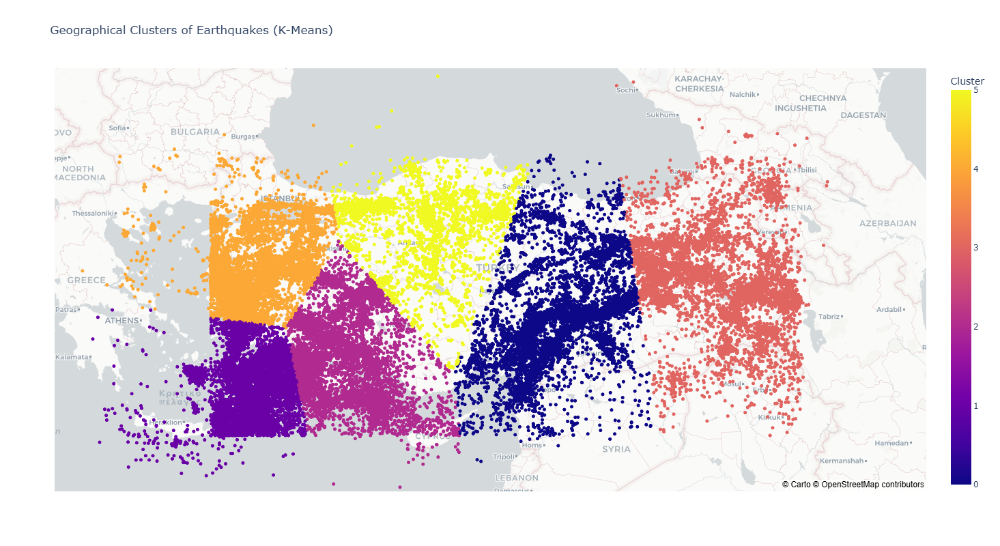

In [247]:
fig = px.scatter_mapbox(
    df,
    lat="Latitude",
    lon="Longitude",
    color="Cluster",
    color_continuous_scale="Plasma",
    center=dict(lat=39, lon=35),
    zoom=5,
    mapbox_style="carto-positron",
    title="Geographical Clusters of Earthquakes (K-Means)",
)
fig.update_layout(height=800)  # Aumenta la altura
fig.show()